In [136]:
import pandas as pd


# Read the CSV file into a DataFrame
df = pd.read_csv('StackOverflow_cleaned_datafile.csv')

# Display the first few rows of the DataFrame
df.head(30)

,ResponseId,MainBranch,Employment,RemoteWork,CodingActivities,EdLevel,YearsCodePro,DevType,OrgSize,Country,...,JobStTeamDrivingStgy,OverallRoleSat,AIDevHaveWorkedWith,AIBen,AIToolCurrently Using,Industry,EmbeddedHaveWorkedWith,AISearchDevHaveWorkedWith,Amount_in__USD,Amount_numeric
0,9,I am a developer by profession,"Employed, full-time",Hybrid,I don’t code outside of work,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",6,"Developer, back-end",I don’t know,Netherlands,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49221.93
1,13,I am a developer by profession,"Employed, full-time",Hybrid,Hobby,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",5,"Developer, full-stack",2 to 9,United States of America,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65000.00
2,23,I am a developer by profession,"Employed, full-time",Fully remote,Hobby;Contribute to open-source projects,Something else,20,"Developer, back-end",100 to 499,Canada,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89777.55
3,24,"I am not primarily a developer, but I write co...","Employed, full-time",Hybrid,I don’t code outside of work,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",6,Other (please specify):,20 to 99,Netherlands,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16350.24
4,32,I am a developer by profession,"Employed, full-time",Fully remote,I don’t code outside of work,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",21,"Developer, full-stack","10,000 or more",United States of America,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102000.00
5,73,"I used to be a developer by profession, but no...","Employed, full-time",Fully remote,I don’t code outside of work,"Associate degree (A.A., A.S., etc.)",22,Other (please specify):,NaN,United States of America,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,130000.00
6,75,I am a developer by profession,"Employed, full-time",Full in-person,I don’t code outside of work,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",6,"Developer, full-stack",10 to 19,Sweden,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3792.97
7,85,I am a developer by profession,"Employed, full-time",Fully remote,I don’t code outside of work,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",7,"Developer, full-stack",20 to 99,United Kingdom of Great Britain and Northern I...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70941.34
8,89,I am a developer by profession,"Employed, full-time",Hybrid,I don’t code outside of work,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",6,"Developer, full-stack",100 to 499,Germany,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71692.81
9,94,I am a developer by profession,"Employed, full-time",Fully remote,Hobby;Contribute to open-source projects;Freel...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",5,"Developer, front-end",10 to 19,United States of America,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,166000.00


In [2]:
import pandas as pd
import scipy.stats as stats

# Assuming you have a DataFrame 'df' with columns 'Country' and 'OverallRoleSat'

# Step 1: Group the data by 'Country' and prepare the data for           ANOVA
# Extract the unique countries
countries = df['Country'].unique()

# Prepare the data for ANOVA
grouped_data = [df[df['Country'] == country]['OverallRoleSat'].dropna() for country in countries]

# Step 2: Perform the one-way ANOVA
f_statistic, p_value = stats.f_oneway(*grouped_data)

# Step 3: Print the results
print(f"F-statistic: {f_statistic}")
print(f"P-value: {p_value}")

# Step 4: Interpretation
alpha = 0.05  # significance level
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference between the countries.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference between the countries.")


F-statistic: 6.587423835892895
P-value: 1.4501337495295084e-17
Reject the null hypothesis: There is a significant difference between the countries.


F-statistic: 6.59:

This indicates that the variability between the means of the countries is significantly larger than the variability within the countries. A higher F-statistic suggests that there are substantial differences between at least some of the groups' means (in this case, the OverallRoleSat scores for each country).
P-value: 1.45 × 10⁻¹⁷:

This p-value is extremely small, far smaller than the common significance threshold of 0.05.
A p-value this small means that the probability of observing these differences in means due to random chance is extremely low.

Since p-value < 0.05, you reject the null hypothesis.

Interpretation:
Reject the null hypothesis: The null hypothesis for ANOVA is that all group means are equal (there is no significant difference between the countries). Since the p-value is very small, we reject this hypothesis.
Conclusion: There is a significant difference in the OverallRoleSat scores between the countries. This means that the countries have different satisfaction scores, and these differences are unlikely to have occurred by random chance.

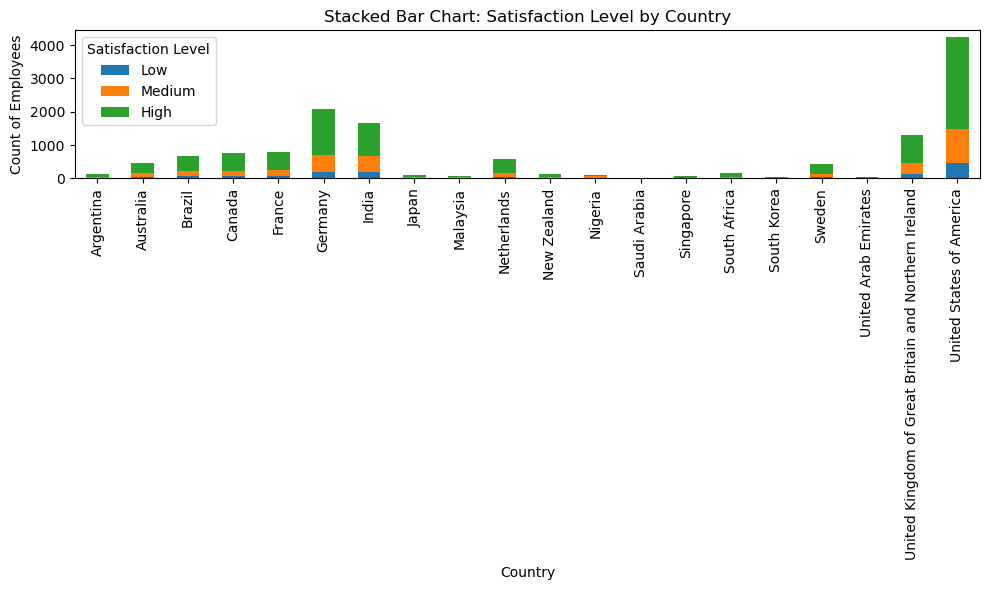

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# Step 1: Bin 'OverallRoleSat' into categories (e.g., Low, Medium, High)
# We can use `pd.cut()` to categorize 'OverallRoleSat' into bins

bins = [0, 4, 7, 10]  # For example, 0-4 (Low), 4-7 (Medium), 7-10 (High)
labels = ['Low', 'Medium', 'High']
df['Satisfaction_Level'] = pd.cut(df['OverallRoleSat'], bins=bins, labels=labels, right=False)

# Step 2: Count the occurrences of each satisfaction level by country
satisfaction_counts = pd.crosstab(df['Country'], df['Satisfaction_Level'])

# Step 3: Plot the stacked bar chart
satisfaction_counts.plot(kind='bar', stacked=True, figsize=(10, 6))

# Add labels and title
plt.title('Stacked Bar Chart: Satisfaction Level by Country')
plt.xlabel('Country')
plt.ylabel('Count of Employees')
plt.legend(title='Satisfaction Level')
plt.xticks(rotation=90)  # Rotate country names if needed for readability

# Show the plot
plt.tight_layout()
plt.show()


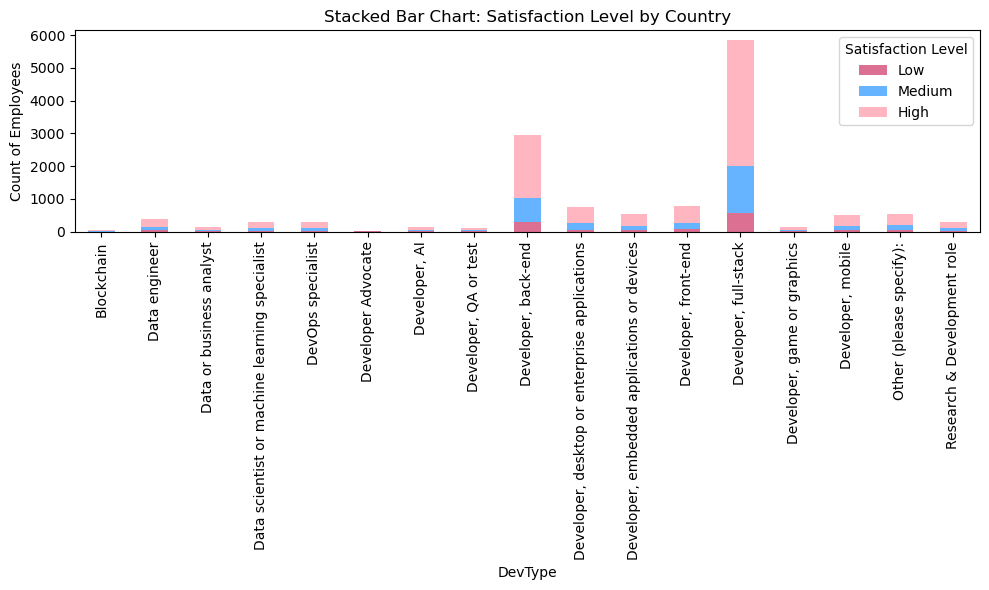

In [12]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# Step 1: Bin 'OverallRoleSat' into categories (e.g., Low, Medium, High)
# We can use `pd.cut()` to categorize 'OverallRoleSat' into bins

bins = [0, 4, 7, 10]  # For example, 0-4 (Low), 4-7 (Medium), 7-10 (High)
labels = ['Low', 'Medium', 'High']
df['Satisfaction_Level'] = pd.cut(df['OverallRoleSat'], bins=bins, labels=labels, right=False)

# Step 2: Count the occurrences of each satisfaction level by DevType
satisfaction_counts = pd.crosstab(df['DevType'], df['Satisfaction_Level'])
#Step 3: Define custom colors for each category (Low, Medium, High)

colors = ['#DB7093', '#66B3FF', '#FFB6C1']

# Step 3: Plot the stacked bar chart
satisfaction_counts.plot(kind='bar', stacked=True, figsize=(10, 6),color=colors)

# Add labels and title
plt.title('Stacked Bar Chart: Satisfaction Level by Country')
plt.xlabel('DevType')
plt.ylabel('Count of Employees')
plt.legend(title='Satisfaction Level')
plt.xticks(rotation=90)  # Rotate country names if needed for readability

# Show the plot
plt.tight_layout()
plt.show()


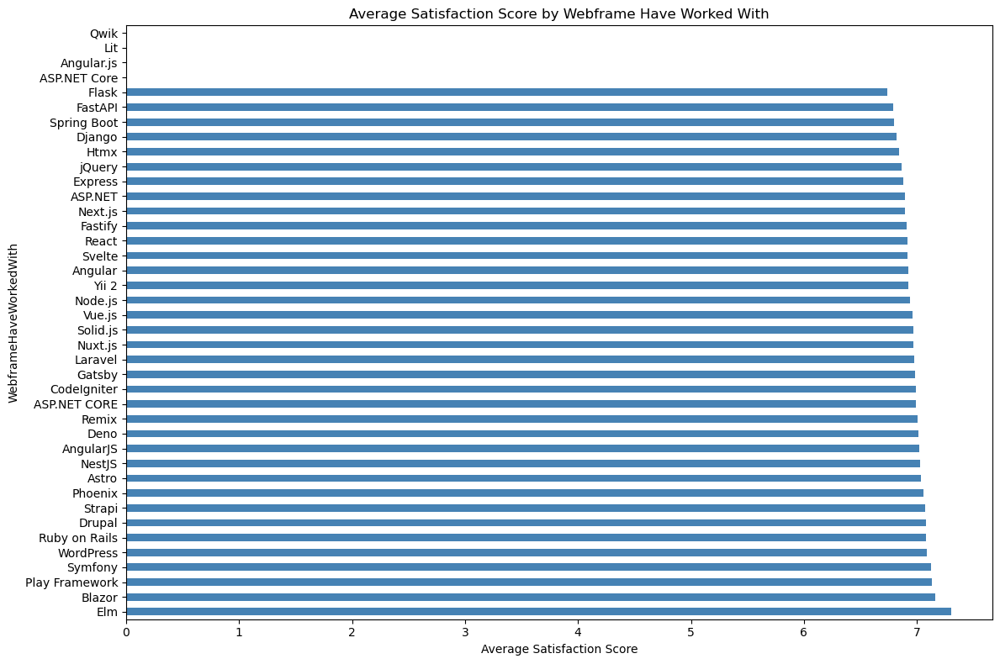

In [86]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with 'WebframeHaveWorkedWith' and 'OverallRoleSat' columns

# Step 1: Split 'WebframeHaveWorkedWith' into multiple rows if multiple frameworks are present
df_expanded = df.assign(WebframeHaveWorkedWith=df['WebframeHaveWorkedWith'].str.split(';')).explode('WebframeHaveWorkedWith')

# Ensure there are no leading/trailing whitespaces in the framework names
df_expanded['WebframeHaveWorkedWith'] = df_expanded['WebframeHaveWorkedWith'].str.strip()

# Step 2: Calculate the average satisfaction score for each framework
avg_satisfaction = df_expanded.groupby('WebframeHaveWorkedWith')['OverallRoleSat'].mean()

# Optional: Reduce the number of categories by selecting the top N (e.g., top 10 frameworks based on average satisfaction)
top_n = 40  # Show top 10 frameworks based on average satisfaction
avg_satisfaction_sorted = avg_satisfaction.sort_values(ascending=False).head(top_n)

# Step 3: Plotting the bar graph
plt.figure(figsize=(12, 8))  # Increase the figure size
avg_satisfaction_sorted.plot(kind='barh', color='#4682B4')  # Horizontal bar plot

# Step 4: Set the labels and title
plt.xlabel('Average Satisfaction Score')  # Label for the x-axis
plt.ylabel('WebframeHaveWorkedWith')  # Label for the y-axis
plt.title('Average Satisfaction Score by Webframe Have Worked With')  # Title of the chart

# Optional: Adjust the layout for better spacing
plt.tight_layout()

# Step 5: Display the plot
plt.show()


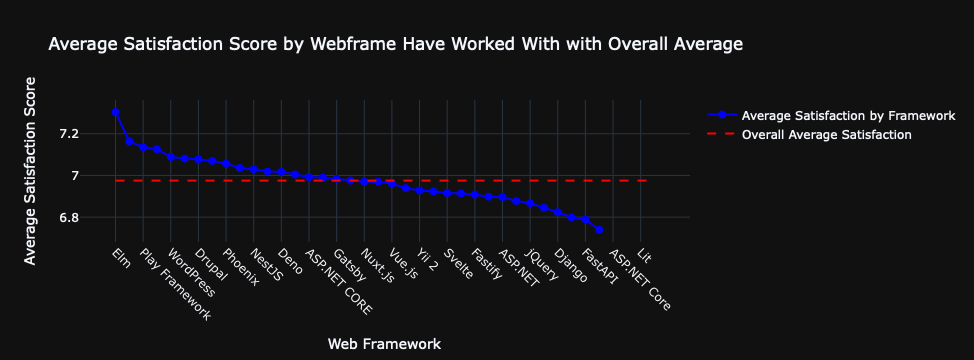

In [88]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Assuming 'df' is your DataFrame with 'WebframeHaveWorkedWith' and 'OverallRoleSat' columns

# Step 1: Split 'WebframeHaveWorkedWith' into multiple rows if multiple frameworks are present
df_expanded = df.assign(WebframeHaveWorkedWith=df['WebframeHaveWorkedWith'].str.split(';')).explode('WebframeHaveWorkedWith')

# Ensure there are no leading/trailing whitespaces in the framework names
df_expanded['WebframeHaveWorkedWith'] = df_expanded['WebframeHaveWorkedWith'].str.strip()

# Step 2: Calculate the average satisfaction score for each framework
avg_satisfaction = df_expanded.groupby('WebframeHaveWorkedWith')['OverallRoleSat'].mean().reset_index()

# Step 3: Calculate the overall average satisfaction score across all frameworks
overall_avg_satisfaction = avg_satisfaction['OverallRoleSat'].mean()

# Step 4: Sort and select the top N (e.g., top 10 frameworks based on average satisfaction)
top_n = 40  # Show top 10 frameworks based on average satisfaction
avg_satisfaction_sorted = avg_satisfaction.sort_values(by='OverallRoleSat', ascending=False).head(top_n)

# Step 5: Create a line chart with Plotly
fig = go.Figure()

# Add the line for average satisfaction scores by framework
fig.add_trace(go.Scatter(
    x=avg_satisfaction_sorted['WebframeHaveWorkedWith'],
    y=avg_satisfaction_sorted['OverallRoleSat'],
    mode='lines+markers',
    name='Average Satisfaction by Framework',
    line=dict(color='blue', width=2),
    marker=dict(size=8)
))

# Add a horizontal line for the overall average satisfaction
fig.add_trace(go.Scatter(
    x=avg_satisfaction_sorted['WebframeHaveWorkedWith'],
    y=[overall_avg_satisfaction] * len(avg_satisfaction_sorted),
    mode='lines',
    name='Overall Average Satisfaction',
    line=dict(color='red', dash='dash', width=2)
))

# Step 6: Update the layout with labels and title
fig.update_layout(
    title='Average Satisfaction Score by Webframe Have Worked With with Overall Average',
    xaxis_title='Web Framework',
    yaxis_title='Average Satisfaction Score',
    showlegend=True,
    xaxis=dict(tickangle=45),  # Rotate x-axis labels for better readability
    template='plotly_dark'  # You can customize this theme if you want
)

# Step 7: Show the plot
fig.show()


##Any framework whose average satisfaction is above the overall average is considered 
#to have higher satisfaction than the general trend.
##Any framework whose average satisfaction is below the overall average is 
##considered to have lower satisfaction than the general trend.

<Figure size 1200x800 with 0 Axes>

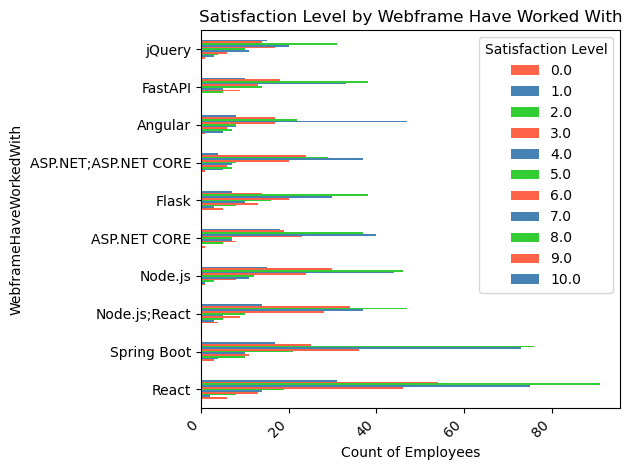

In [81]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with 'WebframeHaveWorkedWith' and 'Satisfaction_Level' columns

# Step 1: Group the data by WebframeHaveWorkedWith and Satisfaction_Level
satisfaction_counts = pd.crosstab(df['WebframeHaveWorkedWith'], df['OverallRoleSat'])

# Optional: Reduce the number of categories by selecting the top N (e.g., top 10 web frameworks)
# Sum across all satisfaction levels to get the total count for each Webframe
satisfaction_counts['Total'] = satisfaction_counts.sum(axis=1)

# Sort the data by the total count in descending order and pick top N
top_n = 10  # Show top 10 web frameworks based on the total count
satisfaction_counts_sorted = satisfaction_counts.sort_values(by='Total', ascending=False).head(top_n)

# Step 2: Plotting the horizontal bar chart
plt.figure(figsize=(12, 8))  # Increase the figure size
satisfaction_counts_sorted.drop(columns='Total').plot(kind='barh', stacked=False, color=['#FF6347', '#4682B4', '#32CD32'])

# Step 3: Set the labels and title
plt.xlabel('Count of Employees')  # Label for the x-axis
plt.ylabel('WebframeHaveWorkedWith')  # Label for the y-axis
plt.title('Satisfaction Level by Webframe Have Worked With')  # Title of the chart

# Optional: Rotate x-axis labels to make them more readable (if applicable)
plt.xticks(rotation=45, ha='right')

# Step 4: Adjust the legend and font size
plt.legend(title='Satisfaction Level', fontsize=10)

# Optional: Adjust the layout for better spacing
plt.tight_layout()

# Step 5: Display the plot
plt.show()


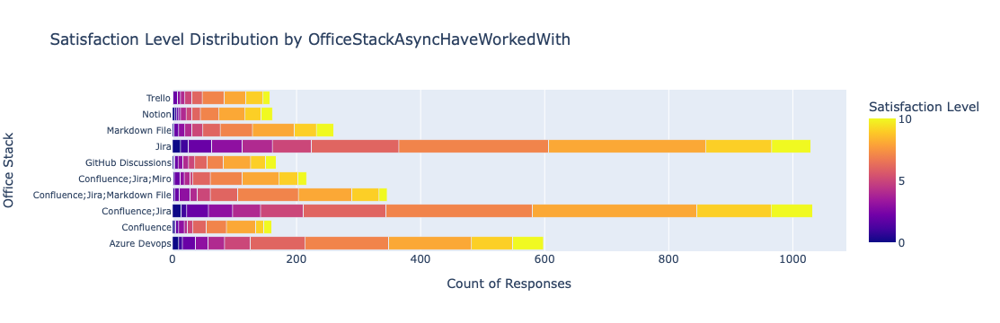

In [80]:
import pandas as pd
import plotly.express as px

# Assuming df is your DataFrame with 'OfficeStackAsyncHaveWorkedWith' and 'OverallRoleSat' columns

# Step 1: Count the satisfaction levels for each 'OfficeStackAsyncHaveWorkedWith' category
satisfaction_counts = df.groupby(['OfficeStackAsyncHaveWorkedWith', 'OverallRoleSat']).size().reset_index(name='Count')

# Optional: Reduce the number of categories by selecting the top N (e.g., top 10 OfficeStackAsyncHaveWorkedWith)
top_n = 10  # Show top 10 OfficeStackAsyncHaveWorkedWith based on the count of satisfaction levels
top_satisfaction_counts = satisfaction_counts.groupby('OfficeStackAsyncHaveWorkedWith').sum().sort_values(by='Count', ascending=False).head(top_n)

# Step 2: Create an interactive bar chart using plotly
fig = px.bar(
    satisfaction_counts[satisfaction_counts['OfficeStackAsyncHaveWorkedWith'].isin(top_satisfaction_counts.index)],
    x='Count',
    y='OfficeStackAsyncHaveWorkedWith',
    color='OverallRoleSat',
    orientation='h',
    title='Satisfaction Level Distribution by OfficeStackAsyncHaveWorkedWith',
    labels={'Count': 'Count of Responses', 'OverallRoleSat': 'Satisfaction Level', 'OfficeStackAsyncHaveWorkedWith': 'Office Stack'},
    hover_data={'OfficeStackAsyncHaveWorkedWith': True, 'OverallRoleSat': True, 'Count': True}
)

# Step 3: Reduce the font size of the y-axis labels
fig.update_layout(
    yaxis=dict(
        tickfont=dict(size=10)  # Adjust the size to your preference
    )
)

# Step 4: Show the plot
fig.show()



In [51]:
import pandas as pd

# Assuming df is your DataFrame and 'YourColumnName' is the column you're interested in

# Get distinct values of a column
distinct_values = df['WebframeHaveWorkedWith'].unique()
value_counts = df['WebframeHaveWorkedWith'].value_counts()

# Print the distinct values
print(value_counts)


print(distinct_values)

WebframeHaveWorkedWith
React                                                                     1651
Spring Boot                                                               1149
Node.js                                                                   1131
Node.js;React                                                              953
jQuery                                                                     909
                                                                          ... 
Angular;AngularJS;Gatsby;Next.js;Node.js;Nuxt.js;React                       1
Deno;Express;FastAPI;jQuery;Node.js;React                                    1
Drupal;Elm;Flask;Gatsby;Laravel;Next.js;Ruby on Rails;Vue.js;WordPress       1
Angular;Django;Express;Flask;NestJS;Next.js;Node.js                          1
Django;Node.js;Spring Boot;Vue.js                                            1
Name: count, Length: 14540, dtype: int64
[nan 'React.js' 'Angular;ASP.NET Core ;React.js' ...
 'Angular;ASP.

In [96]:
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

# Assuming df is your DataFrame with 'ToolsTechHaveWorkedWith' and 'OverallRoleSat' columns

# Step 1: Split 'ToolsTechHaveWorkedWith' into multiple rows if multiple tools are present
df_expanded = df.assign(ToolsTechHaveWorkedWith=df['ToolsTechHaveWorkedWith'].str.split(';')).explode('ToolsTechHaveWorkedWith')

# Step 2: Strip any whitespace from the tool names
df_expanded['ToolsTechHaveWorkedWith'] = df_expanded['ToolsTechHaveWorkedWith'].str.strip()

# Check for any missing values in the features or target variable
if df_expanded['ToolsTechHaveWorkedWith'].isnull().sum() > 0 or df_expanded['OverallRoleSat'].isnull().sum() > 0:
    print("There are missing values in the data. Please handle them before proceeding.")
    # For now, you can drop rows with missing values (though you could also choose imputation)
    df_expanded['ToolsTechHaveWorkedWith'] = df_expanded['ToolsTechHaveWorkedWith'].fillna('Unknown')
df_expanded['OverallRoleSat'] = df_expanded['OverallRoleSat'].fillna(df_expanded['OverallRoleSat'].mean())

# Step 3: One-hot encode the tools using OneHotEncoder
X = df_expanded[['ToolsTechHaveWorkedWith']]  # Features (tools used)
y = df_expanded['OverallRoleSat']  # Target variable (satisfaction score)

# Step 4: Split data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 5: One-Hot Encoding (for Scikit-learn pipeline)
# We will use OneHotEncoder to transform the 'ToolsTechHaveWorkedWith' feature into dummy variables.
encoder = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore')  # handle_unknown='ignore' to avoid issues with unseen categories in the test set

X_train_encoded = encoder.fit_transform(X_train)
X_test_encoded = encoder.transform(X_test)

# Step 6: Add an intercept column for statsmodels (required by OLS)
X_train_encoded = sm.add_constant(X_train_encoded)  # Adds a constant to the independent variables matrix
X_test_encoded = sm.add_constant(X_test_encoded)  # Same for the test set

# Step 7: Fit a Linear Regression model using Statsmodels (OLS)
model = sm.OLS(y_train, X_train_encoded).fit()

# Step 8: Get the model summary (provides detailed stats like p-values, R-squared, etc.)
print(model.summary())

# Optional: Step 9 - Predict on the test set
y_pred = model.predict(X_test_encoded)

# Evaluate the model using scikit-learn's metrics (optional)
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")



There are missing values in the data. Please handle them before proceeding.
                            OLS Regression Results                            
Dep. Variable:         OverallRoleSat   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.609
Date:                Thu, 06 Mar 2025   Prob (F-statistic):            0.00260
Time:                        16:08:56   Log-Likelihood:            -3.4657e+05
No. Observations:              250445   AIC:                         6.932e+05
Df Residuals:                  250388   BIC:                         6.938e+05
Df Model:                          56                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------

In [95]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

# Step 1: Handle missing values (either by dropping or imputing)
df_expanded = df.assign(ToolsTechHaveWorkedWith=df['ToolsTechHaveWorkedWith'].str.split(';')).explode('ToolsTechHaveWorkedWith')
df_expanded['ToolsTechHaveWorkedWith'] = df_expanded['ToolsTechHaveWorkedWith'].str.strip()

# Impute missing values (if any)
df_expanded['ToolsTechHaveWorkedWith'].fillna('Unknown', inplace=True)
df_expanded['OverallRoleSat'].fillna(df_expanded['OverallRoleSat'].mean(), inplace=True)

# Step 2: One-hot encode the features
X = df_expanded[['ToolsTechHaveWorkedWith']]
y = df_expanded['OverallRoleSat']

# Step 3: One-Hot Encoding (for Scikit-learn pipeline)
encoder = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore')

X_encoded = encoder.fit_transform(X)

# Step 4: Split data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Step 5: Ridge Regression model to handle multicollinearity
ridge_model = Ridge(alpha=1.0)  # Alpha is the regularization parameter

# Step 6: Fit the model
ridge_model.fit(X_train, y_train)

# Step 7: Predict on the test set
y_pred = ridge_model.predict(X_test)

# Step 8: Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")




/var/folders/72/g8b973ks1y38yc2wxw93g03m0000gn/T/ipykernel_16087/259008257.py:11: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/var/folders/72/g8b973ks1y38yc2wxw93g03m0000gn/T/ipykernel_16087/259008257.py:12: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing '

Mean Absolute Error: 0.3413451186156012
Mean Squared Error: 0.9331195930525998
R-squared: -0.000473971423667896


In [91]:
# Check for missing values in both features (X) and target (y)
print(X.isnull().sum())  # Check for missing values in X
print(y.isnull().sum())  # Check for missing values in y


WebframeHaveWorkedWith    18118
dtype: int64
179897


In [97]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

# Step 1: Handle missing values (either by dropping or imputing)
df_expanded = df.assign(WebframeHaveWorkedWith=df['WebframeHaveWorkedWith'].str.split(';')).explode('WebframeHaveWorkedWith')
df_expanded['WebframeHaveWorkedWith'] = df_expanded['WebframeHaveWorkedWith'].str.strip()

# Impute missing values (if any)
df_expanded['WebframeHaveWorkedWith'].fillna('Unknown', inplace=True)
df_expanded['OverallRoleSat'].fillna(df_expanded['OverallRoleSat'].mean(), inplace=True)

# Step 2: Define the features and target variable
X = df_expanded[['WebframeHaveWorkedWith']]
y = df_expanded['OverallRoleSat']

# Step 3: One-Hot Encoding (for Scikit-learn pipeline)
encoder = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore')

X_encoded = encoder.fit_transform(X)

# Step 4: Split data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Step 5: Ridge Regression model to handle multicollinearity
ridge_model = Ridge(alpha=1.0)  # Alpha is the regularization parameter

# Step 6: Fit the model
ridge_model.fit(X_train, y_train)

# Step 7: Predict on the test set
y_pred = ridge_model.predict(X_test)

# Step 8: Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the results
print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")



Mean Absolute Error: 0.3339574102096005
Mean Squared Error: 0.9214445652129779
R-squared: 0.00015167201231103267


/var/folders/72/g8b973ks1y38yc2wxw93g03m0000gn/T/ipykernel_16087/3447578689.py:11: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/var/folders/72/g8b973ks1y38yc2wxw93g03m0000gn/T/ipykernel_16087/3447578689.py:12: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing

In [101]:
import pandas as pd
import altair as alt


# Clean the data (if necessary)
df['ToolsTechHaveWorkedWith'] = df['ToolsTechHaveWorkedWith'].str.strip()

# Create a bar chart
chart = alt.Chart(df).mark_bar().encode(
    x='ToolsTechHaveWorkedWith:N',  # Nominal (categorical) variable for the tools
    y='mean(OverallRoleSat):Q',  # Quantitative (continuous) variable for satisfaction (mean)
    color='ToolsTechHaveWorkedWith:N',  # Color by tools to make it visually distinct
    tooltip=['ToolsTechHaveWorkedWith:N', 'mean(OverallRoleSat):Q']  # Tooltip with tool and avg satisfaction
).properties(
    title="Average Satisfaction for Tools Worked With"
)

# If in Jupyter notebook, you can simply evaluate `chart` to render it
chart
df_sampled = df.sample(n=5000, random_state=42)  # Random sample of 5000 rows



In [110]:
## VegaLite for Visualising Role statisfaction Vs Tools  ###3

import pandas as pd
import altair as alt
import warnings

# Ignore all warnings

warnings.filterwarnings('ignore')

# Clean the data (if necessary)
df['ToolsTechHaveWorkedWith'] = df['ToolsTechHaveWorkedWith'].str.strip()

# Sample the dataset to handle large number of rows
df_sampled = df.sample(n=5000, random_state=42)  # Random sample of 5000 rows

# Create a bar chart using the sampled data
chart = alt.Chart(df_sampled).mark_bar().encode(
    x='ToolsTechHaveWorkedWith:N',  # Nominal (categorical) variable for the tools
    y='mean(OverallRoleSat):Q',  # Quantitative (continuous) variable for satisfaction (mean)
    color='ToolsTechHaveWorkedWith:N',  # Color by tools to make it visually distinct
    tooltip=['ToolsTechHaveWorkedWith:N', 'mean(OverallRoleSat):Q']  # Tooltip with tool and avg satisfaction
).properties(
    title="Average Satisfaction for Tools Worked With"
)

# If in Jupyter notebook, you can simply evaluate `chart` to render it
chart


alt.Chart(...)

In [120]:
import pandas as pd
import altair as alt
import warnings

# Ignore all warnings
warnings.filterwarnings('ignore')

# Sample dataset creation (If you already have a 'df' DataFrame, you can skip this part)
# df = pd.read_csv("your_file.csv")

# Clean the data (strip any unwanted spaces)
df['ToolsTechHaveWorkedWith'] = df['ToolsTechHaveWorkedWith'].str.strip()

# Split the 'ToolsTechHaveWorkedWith' column by ';' and explode it to get each tool in a separate row
df['Tools'] = df['ToolsTechHaveWorkedWith'].str.split(';')
df_exploded = df.explode('Tools')

# Remove any extra spaces from the 'Tools' column
df_exploded['Tools'] = df_exploded['Tools'].str.strip()

# Group by 'Country' and 'Tools' and count the occurrences
tool_counts_by_country = df_exploded.groupby(['Country', 'Tools']).size().reset_index(name='Tool Count')

# Create a filter selection for country
country_selector = alt.selection_single(
    fields=['Country'],
    bind=alt.binding_select(options=df['Country'].unique().tolist(), name="Select Country: ")
)

# Create a filter selection for tools
tool_selector = alt.selection_single(
    fields=['Tools'],
    bind=alt.binding_select(options=df_exploded['Tools'].unique().tolist(), name="Select Tool: ")
)

# Create a bar chart using Vega-Lite via Altair
chart = alt.Chart(tool_counts_by_country).mark_bar().encode(
    x='Country:N',  # Nominal (categorical) variable for the country
    y='sum(Tool Count):Q',  # Quantitative (continuous) variable for the count of tools
    color='Tools:N',  # Color by tool to differentiate them
    tooltip=['Country:N', 'Tools:N', 'sum(Tool Count):Q']  # Tooltip with country, tool, and count
).properties(
    title="Count of Tools Used by Country"
).configure_mark(
    opacity=0.7
).add_selection(
    country_selector,
    tool_selector
).transform_filter(
    country_selector
).transform_filter(
    tool_selector
)

# Display the chart
chart


alt.Chart(...)

In [121]:
import pandas as pd
import altair as alt
import warnings

# Ignore all warnings
warnings.filterwarnings('ignore')

# Clean the data (strip any unwanted spaces)
df['ToolsTechHaveWorkedWith'] = df['ToolsTechHaveWorkedWith'].str.strip()

# Split the 'ToolsTechHaveWorkedWith' column by ';' and explode it to get each tool in a separate row
df['Tools'] = df['ToolsTechHaveWorkedWith'].str.split(';')
df_exploded = df.explode('Tools')

# Remove any extra spaces from the 'Tools' column
df_exploded['Tools'] = df_exploded['Tools'].str.strip()

# Group by 'Country' and 'Tools' and count the occurrences
tool_counts_by_country = df_exploded.groupby(['Country', 'Tools']).size().reset_index(name='Tool Count')

# Find the highest tool for each country (tool with max count)
highest_tool_by_country = tool_counts_by_country.loc[
    tool_counts_by_country.groupby('Country')['Tool Count'].idxmax()
]

# Create a bar chart using Vega-Lite via Altair
chart = alt.Chart(highest_tool_by_country).mark_bar().encode(
    x='Country:N',  # Nominal (categorical) variable for the country
    y='Tool Count:Q',  # Quantitative (continuous) variable for the count of tools
    color='Tools:N',  # Color by tool to differentiate them
    tooltip=['Country:N', 'Tools:N', 'Tool Count:Q']  # Tooltip with country, tool, and count
).properties(
    title="Most Frequent Tool Used by Country"
).configure_mark(
    opacity=0.7
)

# Display the chart
chart


alt.Chart(...)

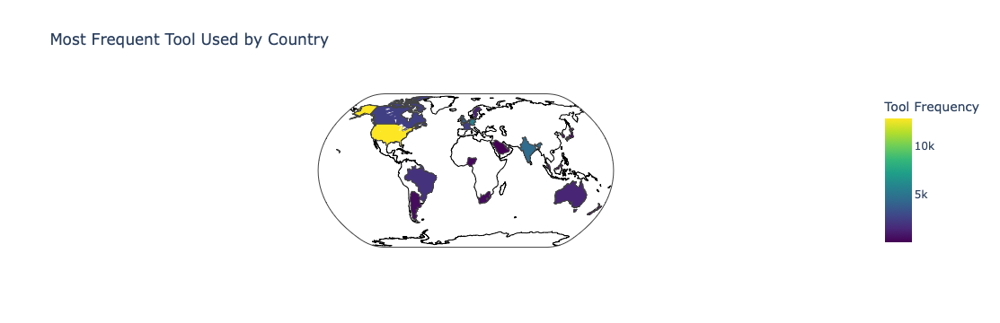

In [125]:
### Choroplet chart for frequently used tools by each country ###

import pandas as pd
import plotly.graph_objects as go
import warnings

# Ignore warnings
warnings.filterwarnings('ignore')



# Clean the data (strip spaces)
df['ToolsTechHaveWorkedWith'] = df['ToolsTechHaveWorkedWith'].str.strip()

# Split the 'ToolsTechHaveWorkedWith' column by ';' and explode it to get each tool in a separate row
df['Tools'] = df['ToolsTechHaveWorkedWith'].str.split(';')
df_exploded = df.explode('Tools')

# Remove any extra spaces from the 'Tools' column
df_exploded['Tools'] = df_exploded['Tools'].str.strip()

# Group by 'Country' and 'Tools' and count the occurrences
tool_counts_by_country = df_exploded.groupby(['Country', 'Tools']).size().reset_index(name='Tool Count')

# Find the highest tool for each country (tool with max count)
highest_tool_by_country = tool_counts_by_country.loc[
    tool_counts_by_country.groupby('Country')['Tool Count'].idxmax()
]

# Plotting using Plotly for Choropleth map (no geopandas required)
fig = go.Figure(go.Choropleth(
    locations=highest_tool_by_country['Country'],  # Country names
    z=highest_tool_by_country['Tool Count'],  # The frequency of tools used per country
    hovertext=highest_tool_by_country['Tools'],  # Tool name as hover text
    hoverinfo='location+z+text',  # Correct hoverinfo for location, count, and tool name
    colorscale='Viridis',  # Color scale
    colorbar_title="Tool Frequency",
    locationmode='country names'  # Use country names directly (no need for iso_a3)
))

fig.update_layout(
    title_text='Most Frequent Tool Used by Country',
    geo=dict(
        showcoastlines=True,
        coastlinecolor='Black',
        projection_type='natural earth',
        showland=True,
        landcolor='white',
        countrycolor='Black'
    )
)

# Show the map
fig.show()


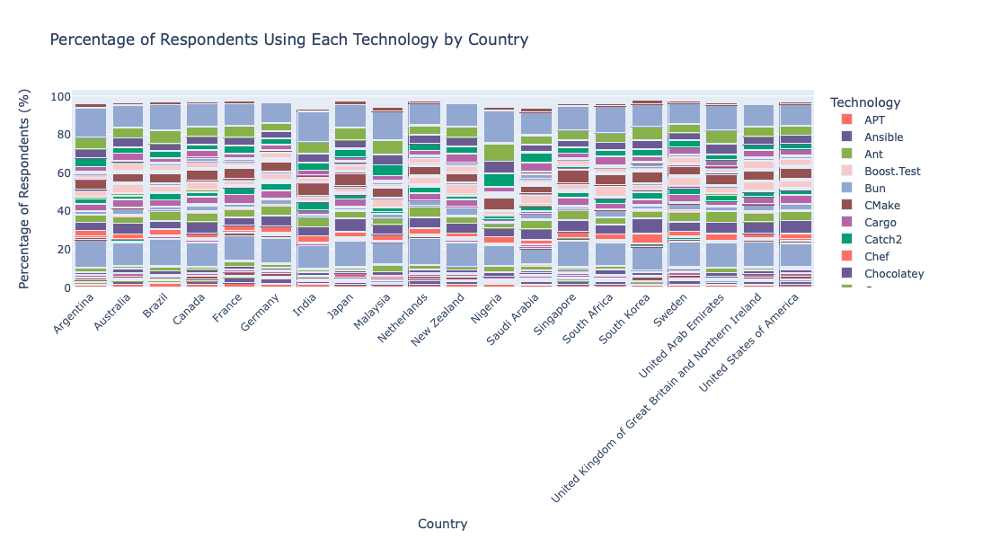

In [145]:
# Regional Segmentation (percentage of respondents using each tech by region/country) ###

import pandas as pd
import plotly.express as px
import warnings

# Ignore warnings
warnings.filterwarnings('ignore')



# Clean the data (strip spaces)
df['ToolsTechHaveWorkedWith'] = df['ToolsTechHaveWorkedWith'].str.strip()

# Split the 'ToolsTechHaveWorkedWith' column by ';' and explode it to get each tool in a separate row
df['Tools'] = df['ToolsTechHaveWorkedWith'].str.split(';')
df_exploded = df.explode('Tools')

# Remove any extra spaces from the 'Tools' column
df_exploded['Tools'] = df_exploded['Tools'].str.strip()

# Group by 'Country' and 'Tools' to count the frequency of tools used in each country
tool_counts_by_country = df_exploded.groupby(['Country', 'Tools']).size().reset_index(name='Tool Count')

# Calculate the total respondents in each country to compute percentage
total_respondents_per_country = df_exploded.groupby('Country')['Country'].count().reset_index(name='Total Respondents')

# Merge to get total respondents per country
tool_counts_by_country = pd.merge(tool_counts_by_country, total_respondents_per_country, on='Country')

# Calculate percentage of respondents using each tool in the country
tool_counts_by_country['Percentage'] = (tool_counts_by_country['Tool Count'] / tool_counts_by_country['Total Respondents']) * 100

# Plot using Plotly to create a stacked bar chart
fig = px.bar(
    tool_counts_by_country,
    x='Country',
    y='Percentage',
    color='Tools',
    title='Percentage of Respondents Using Each Technology by Country',
    labels={'Percentage': 'Percentage of Respondents (%)', 'Country': 'Country', 'Tools': 'Technology'},
    color_discrete_sequence=['#FF6F61', '#6B5B95', '#88B04B', '#F7CAC9', '#92A8D1', '#955251', '#B565A7', '#009E73'],
    hover_data={
        'Percentage': ':.2f%',  # Format percentage to 2 decimal places
        'Tools': True,
        'Country': True
    }  # Brighter custom colors
)

# Customize layout
fig.update_layout(
    barmode='stack',  # Stack bars to show proportions
    xaxis_title='Country',
    yaxis_title='Percentage of Respondents (%)',
    xaxis_tickangle=-45,
    xaxis=dict(tickmode='linear', tick0=0, dtick=1),  # Adjust x-axis ticks
    bargap=0.15,  # Increase the space between bars
    height=600,  # Increase the height for better visibility
    width=800,  # Increase the width for better visibility
    yaxis_tickformat='.2f%'  # Format y-axis ticks to show percentages with one decimal place
)

# Show the plot
fig.show()
